In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [2]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [3]:
import DiadFit as pf
pf.__version__

'0.0.22'

In [4]:
# Add the path with your spectra in
mypath=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\High_Density_Looping_Run\Spectra'

In [5]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt'
# Specifying the extension here helps to filter out other file types,
# e.g. png files that may be in the folder
file_ext='.txt'
# If your instrument appends a nubmer like 01, 02 to each file, prefix=True removes it
prefix=False

## This function finds all files in your path with the specified file format
- As you will fit your Ne lines in a different workbook, you can use 'exclude_str' to put any text that appears in all your Ne files, and it won't look here

In [6]:
Diad_files=pf.get_files(path=mypath, file_ext=file_ext, exclude_str='Ne',
                 exclude_str_2='ne')
#Diad_files

exclude type
.png


## Lets plot them all

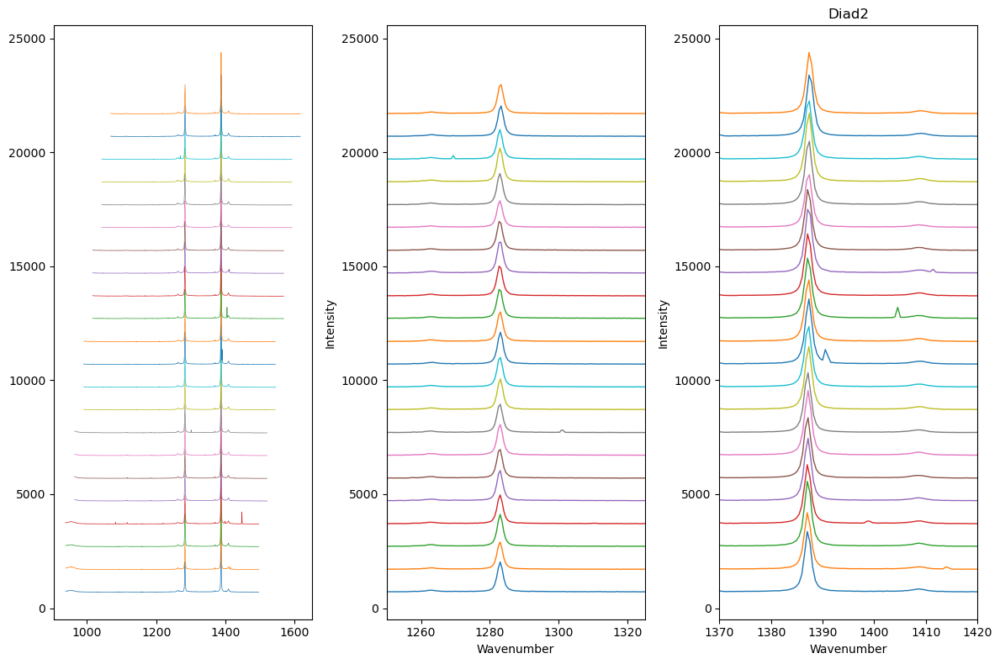

In [7]:
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(12,8))
i=0
lw=1
for file in Diad_files:
    Diad=pf.get_data(path=mypath, filename=file, filetype=filetype)
    ax0.plot(Diad[:, 0], Diad[:, 1]+i, '-', lw=0.5)
    ax1.plot(Diad[:, 0], Diad[:, 1]+i, '-', lw=1)
    ax1.set_xlim([1250, 1325])  
    
    ax2.set_title('Diad2')
    ax2.plot(Diad[:, 0],Diad[:, 1]+i, '-', lw=1)
    ax2.set_xlim([1370, 1420])
    i=i+1000
    
#ax0.set_xlabel('Wavenumber')
#ax0.set_ylabel('Intensity')
ax1.set_xlabel('Wavenumber')
ax1.set_ylabel('Intensity')
ax2.set_xlabel('Wavenumber')
ax2.set_ylabel('Intensity')   
fig.tight_layout()

## Select the first file you want to fit
- This allows you to tweak parameters for your spectra and your instrument

In [8]:
filename=Diad_files[10] # This finds the first file

# Alternatively, you can specify the actual file name if you want to fit a specific one
#filename='007_k9.csv'
print(filename)

FI_1275up_1.txt


## First we plot the spectra
- This lets you look at the spectra, decide how strong your hotbands are, and see how elevated the diads are (if they are very elevated, you may need to fit a gaussian background too)

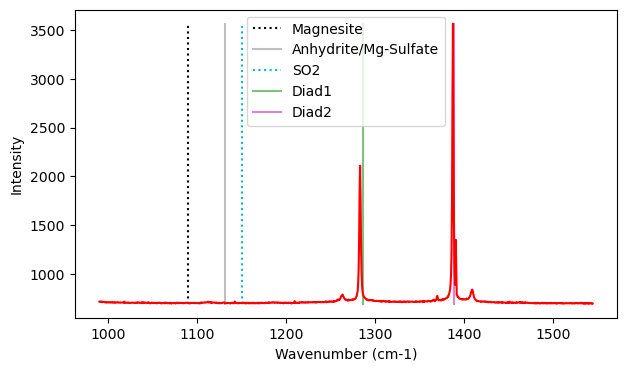

In [9]:
pf.plot_diad(path=mypath, filename=filename, filetype=filetype)

## After inspecting the spectra, decide if you want to fit the carbonate peak
- First, look at the presets, you can edit them in carb_peak_config by typing the variable name, and a new value

In [10]:
# Decide if you want to fit a carbonate peak or not here. 
fit_carbonate=False

# Tweak options here, can exclude a range for example using exclude_range=Tuple[float, float]
Carb_Config=pf.carb_peak_config(lower_bck=(1060, 1065), upper_bck=(1120, 1330))
Carb_Config   

carb_peak_config(lower_bck=(1060, 1065), upper_bck=(1120, 1330), N_poly_carb_bck=1, amplitude=1000, cent_carbonate=1090, outlier_sigma=12, N_peaks=3, distance=10, prominence=5, width=6, threshold=0.1, exclude_range=None, dpi=100, plot_figure=True)

## This actually does the work fitting the carbonate peak

In [11]:
Carb_fit=pf.fit_carbonate_peak(config=Carb_Config, path=mypath, 
filename=filename, filetype=filetype,
fit_carbonate=fit_carbonate)
Carb_fit

## Now lets plot the diads
- As with carbonate, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [12]:
diad_id_config=pf.diad_id_config(width=0.1)
diad_id_config

diad_id_config(exclude_range1=None, exclude_range2=None, approx_diad2_pos=(1379, 1395), approx_diad1_pos=(1275, 1295), height=400, distance=5, threshold=0.5, width=0.1, prominence=10, plot_figure=True)

Initial estimates: Diad1+HB=[1283.  1262.5], Diad2+HB=[1387.  1408.6]


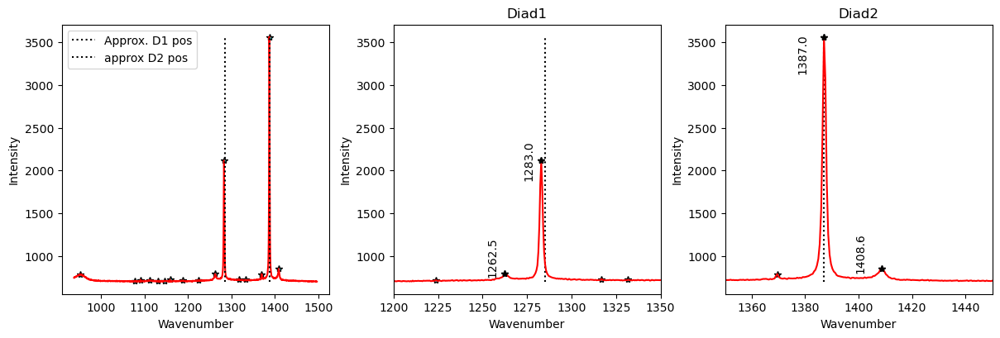

In [13]:
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands
n_peaks_diad1=2
n_peaks_diad2=2 

filename='FI_1225up_1.txt'  # Other bad ones - FI_1225up_1, FI_1325down_2, FI_1325down_2 
diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
                        path=mypath, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, n_peaks_diad2=n_peaks_diad2,
                                               block_print=False)

## If you have no diads visible...
- change True to False, and it will just save the carbonate peak parameters

In [14]:
diads_present=True
pf.proceed_to_fit_diads(filename, Carb_fit, diads_present=diads_present)

Move on to fit diads


## Fit Diad 1
- This function uses the guess of the peak parameters above. 
- For very dense diads, you may need to fit a gaussian background, defined by peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000
- Otherwise, the background is fitted with a polynomial you can set the degree for (Default =1) based on background positoins defined by lower_bck, upper_bck...
- If plot_figure=True, it saves the figure in its own folder in the path, so you can inspect all the fits at a later date. 

In [15]:
diad1_fit_config=pf.diad1_fit_config(peak_pos_gauss=(1280), 
                                     gauss_sigma=10,
                                     gauss_amp=200,
                                    lower_bck_diad1=(1180, 1220),
                                     upper_bck_diad1=(1320, 1350),
                                     x_range_residual=10, x_range_baseline=50,
                                    HB_amplitude=100, diad_amplitude=1000)
diad1_fit_config

diad1_fit_config(peak_pos_gauss=1280, gauss_sigma=10, gauss_amp=200, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1320, 1350), diad_amplitude=1000, HB_amplitude=100, x_range_baseline=50, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

0.5554851908946925
0.5554851908946925
Gauss_cent=1278.63725422287
Gauss_amp=881.0276176492561
Gauss_sigma=19.870790283947958
Making summary figure of different fits for saving


,Diad1_Cent,Diad1_Area,HB1_Cent,HB1_Area,Residual_Diad1
0,1282.977521,3646.386988,1262.836438,315.334186,2.843376


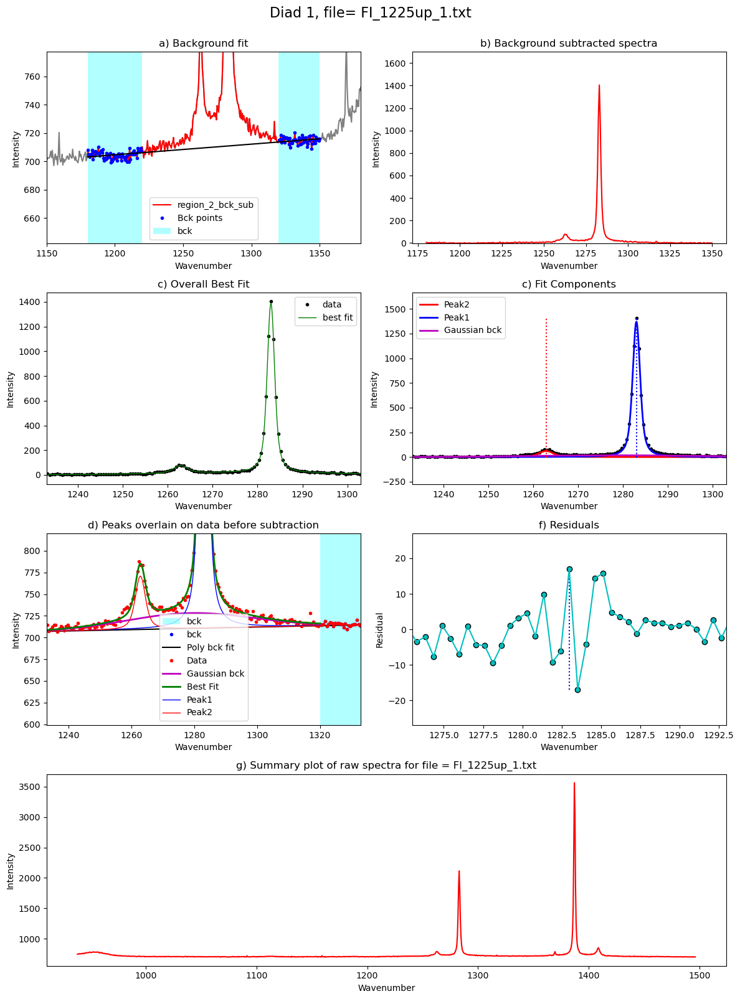

In [16]:
# For very dense spectra, with a very elevated background, you'll need to add a gaussian fit
# If you put a number in brackets, it'll center a gaussian extra background near there. 

# Do you want to save the figure?
plot_figure=True
# This function does the work fitting the diad
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=mypath, filename=filename, filetype=filetype, block_print=False)
Diad1_fit

## Fit diad 2

In [19]:
diad2_fit_config=pf.diad2_fit_config(x_range_residual=10, x_range_baseline=50,
                                     lower_bck_diad2=(1320, 1340),
                                     peak_pos_gauss=(1390), 
                                     gauss_sigma=10,
                                     gauss_amp=200,
                                   diad_amplitude=10  )
diad2_fit_config

diad2_fit_config(peak_pos_gauss=1390, gauss_sigma=10, gauss_amp=200, N_poly_bck_diad2=1, lower_bck_diad2=(1320, 1340), upper_bck_diad2=(1440, 1470), diad_amplitude=10, HB_amplitude=20, x_range_baseline=50, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

1387.1392443864888
<Parameter 'sigma', value=0.4604908373469987 +/- 0.00435, bounds=[0:inf]>
Fitting 2 voigt peaks iteratively 
working on voigt peak0
working on voigt peak1
Gauss_cent=1387.0426459258424
Gauss_amp=1347.1858550827383
Gauss_sigma=15.707531540985487
made df
Making summary figure of different fits for saving
Index(['Diad2_Cent', 'Diad2_Area', 'HB2_Cent', 'HB2_Area', 'Residual_Diad2'], dtype='object')


,Diad2_Cent,Diad2_Area,HB2_Cent,HB2_Area,Residual_Diad2
0,1387.139333,6064.44332,1408.615281,571.572445,5.478375


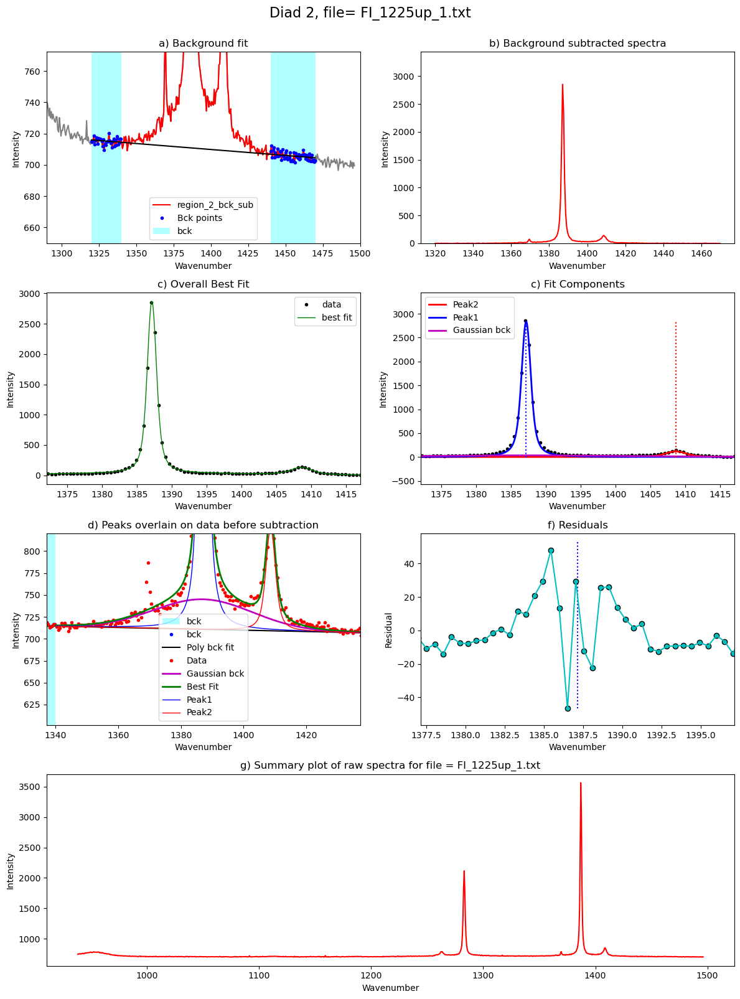

In [20]:
# Do you want to save the figure?
plot_figure=True
# This function does the work fitting the diad
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad2_peaks,
path=mypath, filename=filename, filetype=filetype, block_print=False)
Diad2_fit

## Combine and save
- Saves to clipboard if to_clipboard=True (e.g. you can paste into a spreadsheet)
- Also saves to 'csv' in a folder in "mypath" if to_csv=True)
- It also makes a new 

In [21]:
out=pf.combine_diad_outputs(filename=filename, prefix=prefix, 
Diad1_fit=Diad1_fit, to_clipboard=True, to_csv=True, path=mypath,
Diad2_fit=Diad2_fit, Carb_fit=Carb_fit)
out

,filename,Splitting,Diad1_Cent,Diad1_Area,Residual_Diad1,Diad2_Cent,Diad2_Area,Residual_Diad2,HB1_Cent,HB1_Area,HB2_Cent,HB2_Area,C13_Cent,C13_Area
0,FI_1225up_1,104.161812,1282.977521,3646.386988,2.843376,1387.139333,6064.44332,5.478375,1262.836438,315.334186,1408.615281,571.572445,NaN,0


In [22]:
out

,filename,Splitting,Diad1_Cent,Diad1_Area,Residual_Diad1,Diad2_Cent,Diad2_Area,Residual_Diad2,HB1_Cent,HB1_Area,HB2_Cent,HB2_Area,C13_Cent,C13_Area
0,FI_1225up_1,104.161812,1282.977521,3646.386988,2.843376,1387.139333,6064.44332,5.478375,1262.836438,315.334186,1408.615281,571.572445,NaN,0


## You can also try looping if all your spectra are pretty similar

  0%|                                                                                           | 0/22 [00:00<?, ?it/s]

0.5557321998550446
0.5557321998550446


  5%|███▊                                                                               | 1/22 [00:01<00:39,  1.87s/it]

0.5556058549127436
0.5556058549127436


  9%|███████▌                                                                           | 2/22 [00:03<00:38,  1.94s/it]

0.5554851908946925
0.5554851908946925


 14%|███████████▎                                                                       | 3/22 [00:05<00:37,  1.99s/it]

0.5579723227991138
0.5579723227991138


 18%|███████████████                                                                    | 4/22 [00:08<00:40,  2.24s/it]

0.5573270698049904
0.5573270698049904


 23%|██████████████████▊                                                                | 5/22 [00:10<00:38,  2.28s/it]

0.5544718053047937
0.5544718053047937


 27%|██████████████████████▋                                                            | 6/22 [00:13<00:37,  2.35s/it]

0.5570475881654051
0.5570475881654051


 32%|██████████████████████████▍                                                        | 7/22 [00:15<00:35,  2.36s/it]

0.5540788036695801
0.5540788036695801


 36%|██████████████████████████████▏                                                    | 8/22 [00:18<00:34,  2.44s/it]

0.5573726662766787
0.5573726662766787


 41%|█████████████████████████████████▉                                                 | 9/22 [00:20<00:31,  2.40s/it]

Warning - couldnt find hotband, guessing its positoin as 20 below the peak
0.556089465893818
0.556089465893818


 45%|█████████████████████████████████████▎                                            | 10/22 [00:22<00:28,  2.36s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:1642: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


0.5535457962138441
0.5535457962138441


 50%|█████████████████████████████████████████                                         | 11/22 [00:25<00:26,  2.42s/it]

0.5530212090862234
0.5530212090862234


 55%|████████████████████████████████████████████▋                                     | 12/22 [00:27<00:24,  2.42s/it]

0.5553320833015822
0.5553320833015822


 59%|████████████████████████████████████████████████▍                                 | 13/22 [00:30<00:21,  2.43s/it]

0.5541667989453194
0.5541667989453194


 64%|████████████████████████████████████████████████████▏                             | 14/22 [00:32<00:18,  2.33s/it]

0.5553924723865664
0.5553924723865664


 68%|███████████████████████████████████████████████████████▉                          | 15/22 [00:35<00:16,  2.42s/it]

0.5582116315672709
0.5582116315672709


 73%|███████████████████████████████████████████████████████████▋                      | 16/22 [00:37<00:14,  2.37s/it]

0.560164059950168
0.560164059950168


 77%|███████████████████████████████████████████████████████████████▎                  | 17/22 [00:39<00:11,  2.27s/it]

0.5619062114539013
0.5619062114539013


 82%|███████████████████████████████████████████████████████████████████               | 18/22 [00:41<00:08,  2.20s/it]

0.5630134967844642
0.5630134967844642


 86%|██████████████████████████████████████████████████████████████████████▊           | 19/22 [00:44<00:07,  2.45s/it]

0.5426550236399017
0.5426550236399017


 91%|██████████████████████████████████████████████████████████████████████████▌       | 20/22 [00:46<00:04,  2.36s/it]

0.5552338401307271
0.5552338401307271


 95%|██████████████████████████████████████████████████████████████████████████████▎   | 21/22 [00:48<00:02,  2.25s/it]

0.5569589798129166
0.5569589798129166


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [00:50<00:00,  2.30s/it]


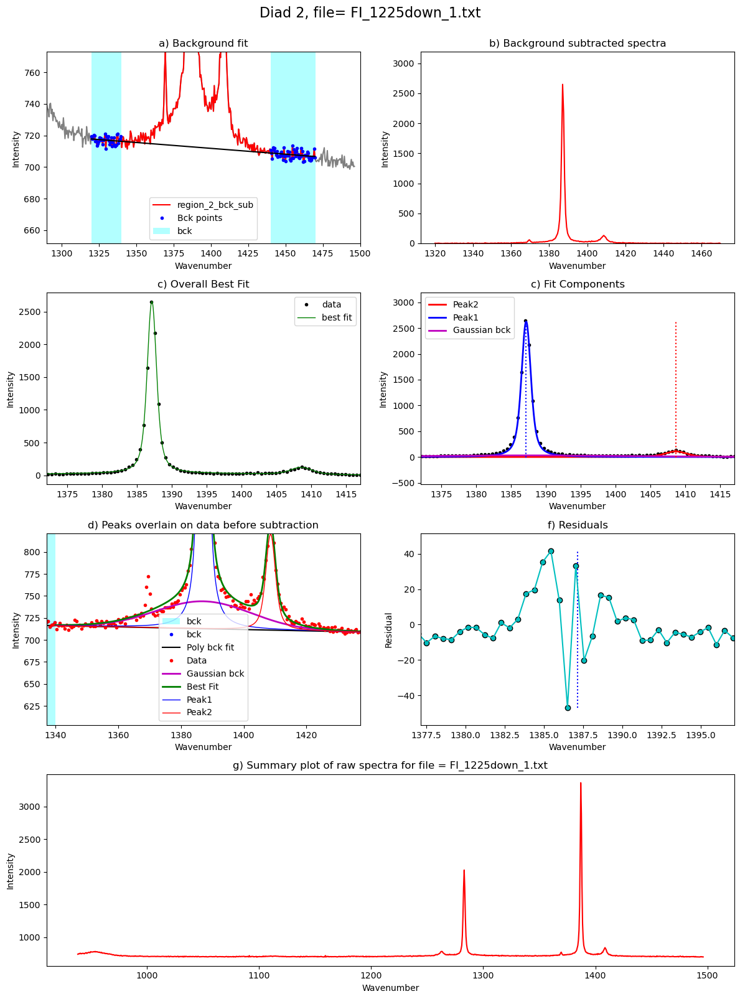

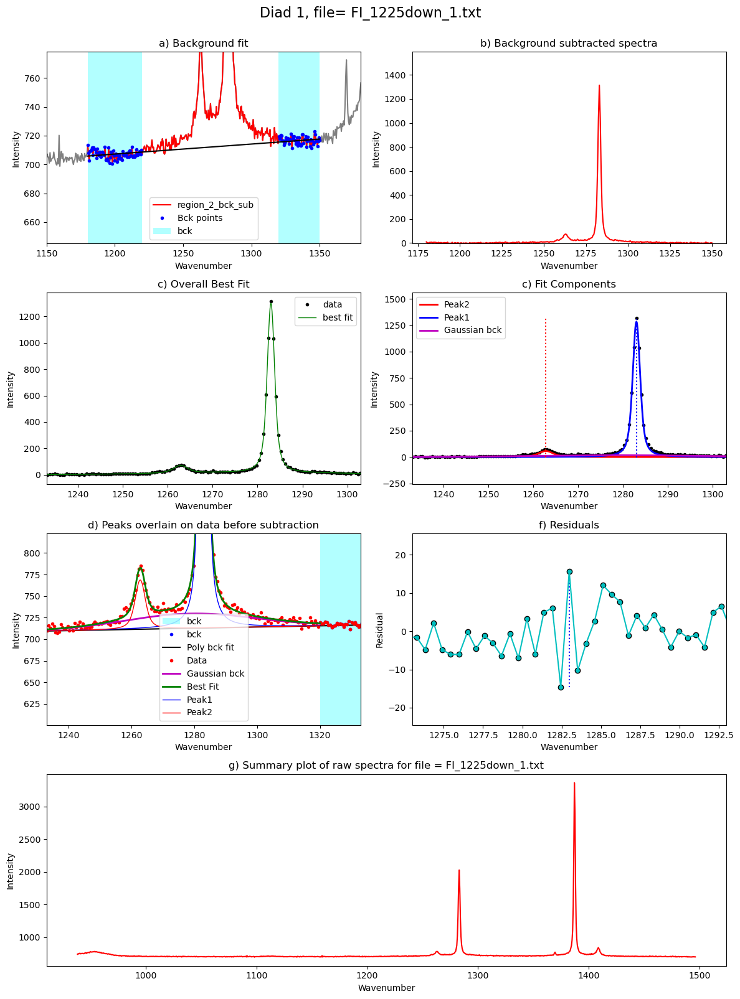

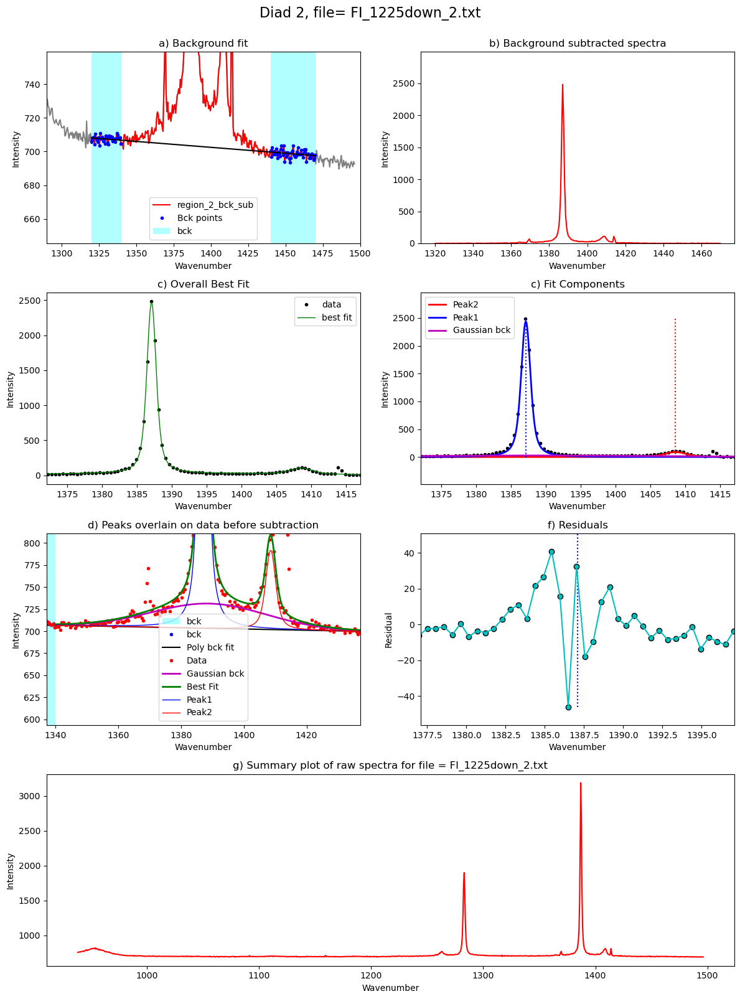

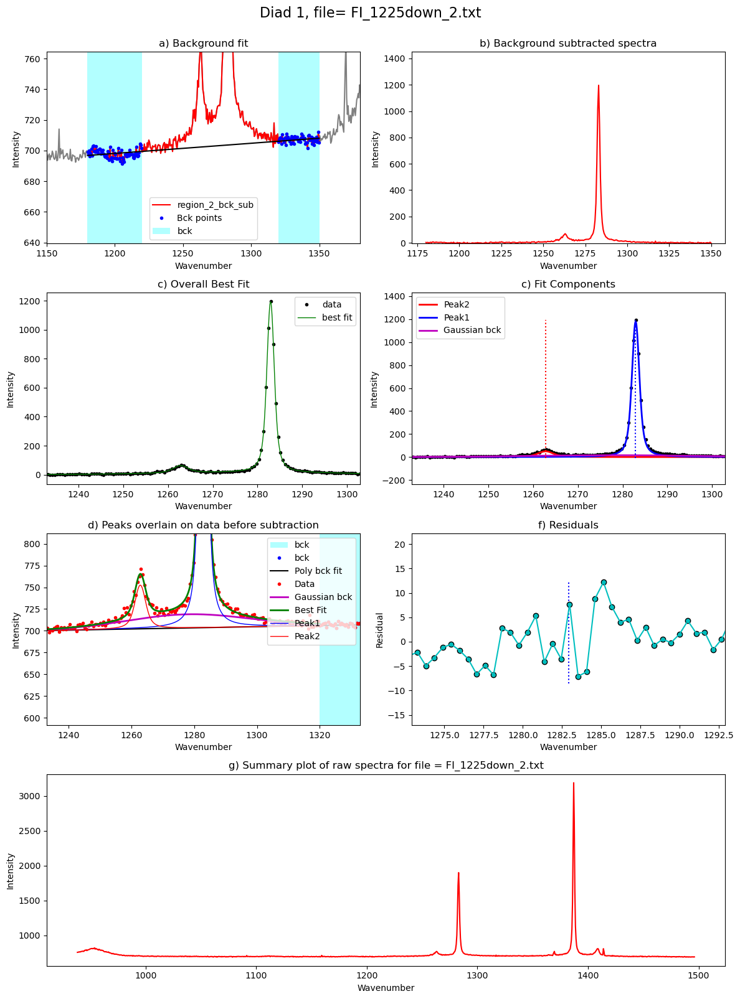

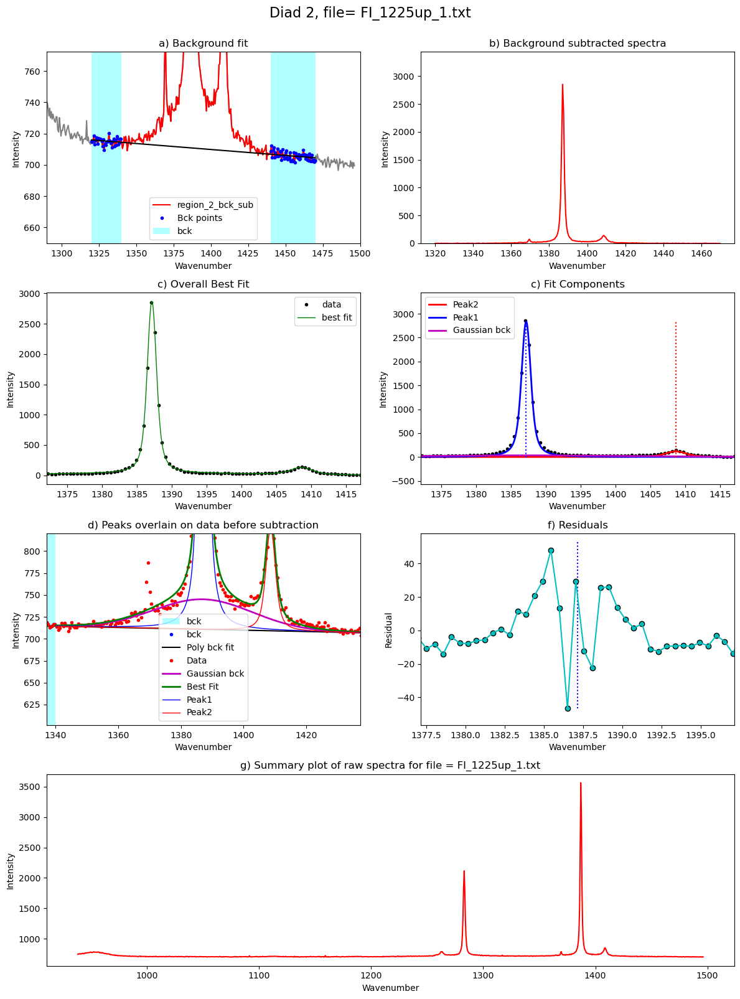

...

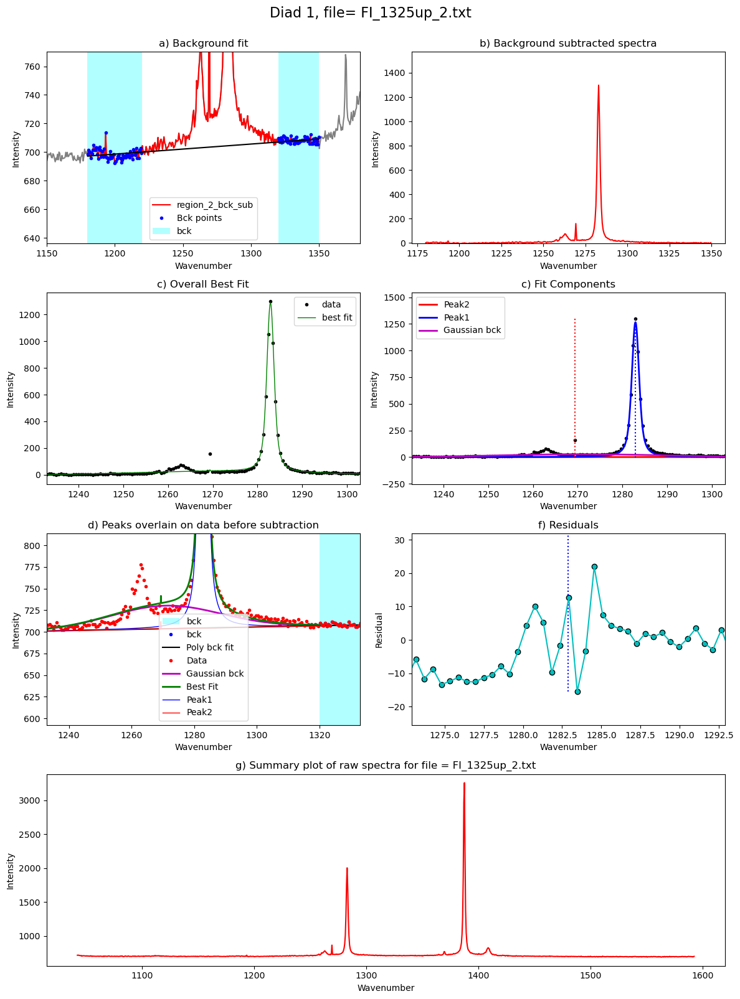

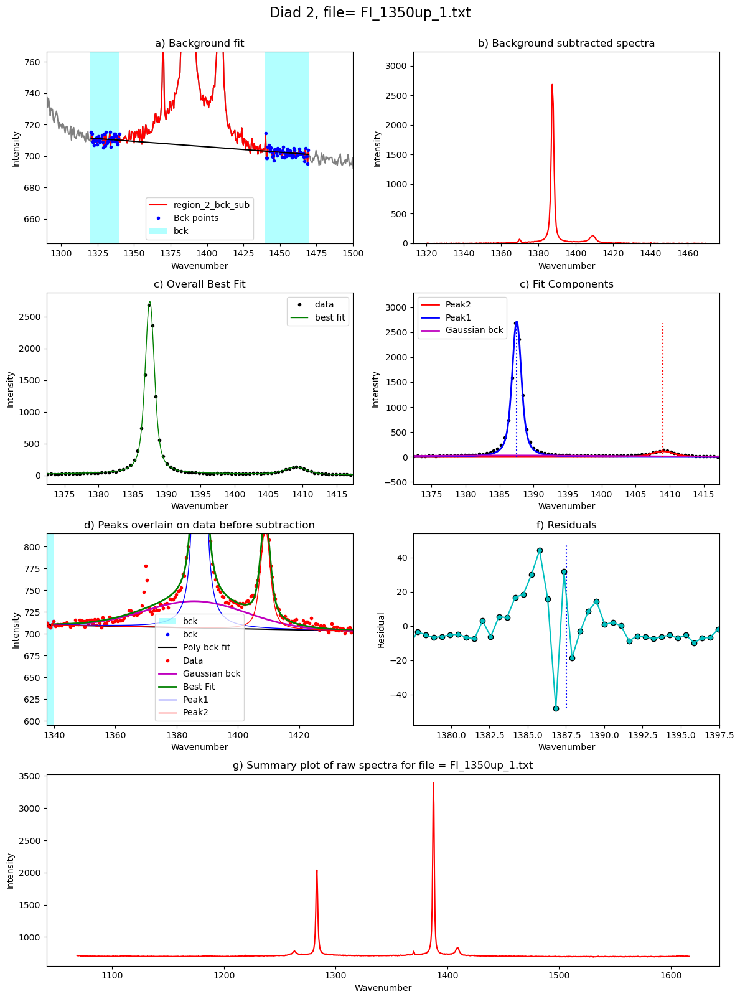

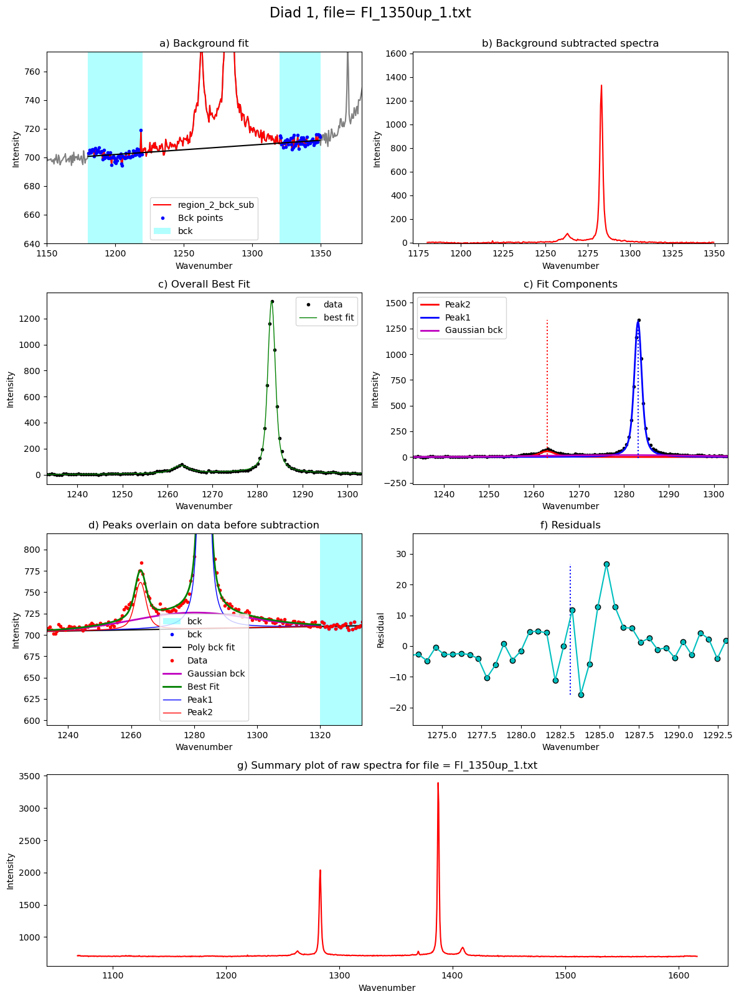

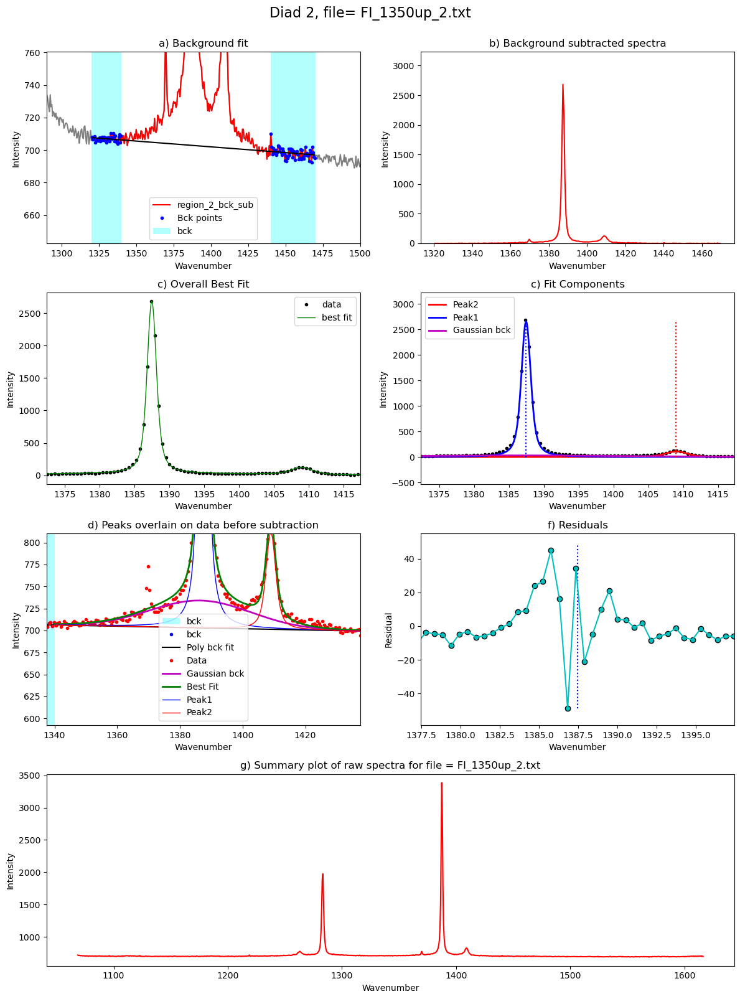

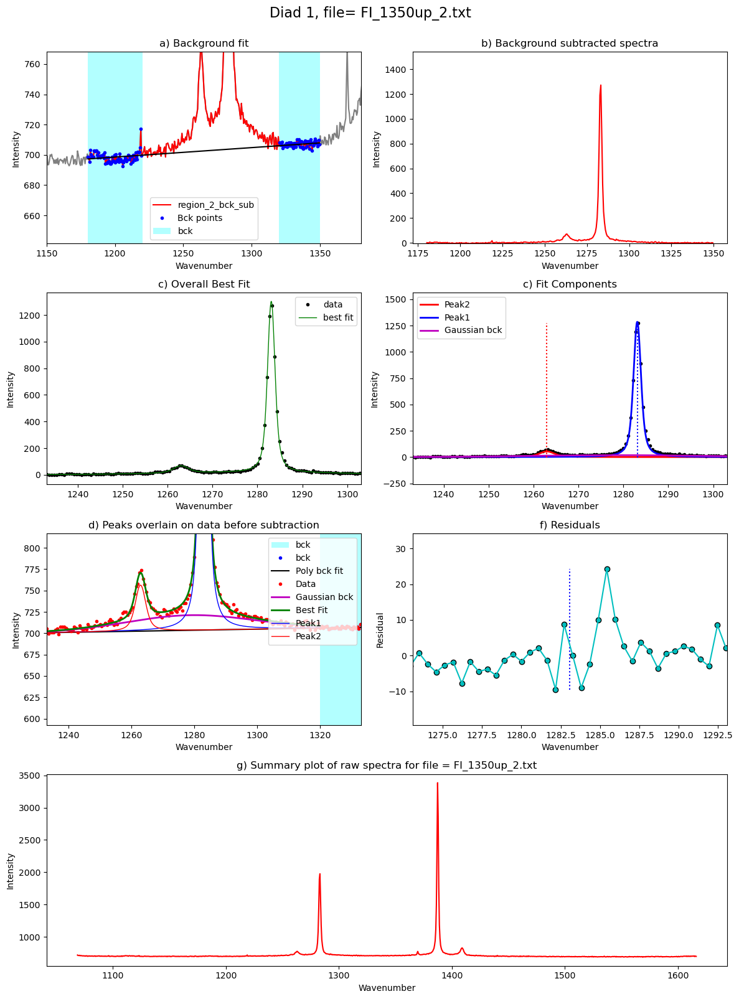

In [23]:
from tqdm import tqdm
plot_figure=True # Means doesnt make figures, lot faster. 
save_excel=True # Saves to excel
save_clipboard=True # Copies to clipboard

df = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_files))):
    
    filename=Diad_files[i]

    
    diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
            path=mypath, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
    n_peaks_diad2=n_peaks_diad2, plot_figure=False)

    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,
    path=mypath, filename=filename, filetype=filetype)
    
    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=mypath, filename=filename, filetype=filetype)
    
    data=pf.combine_diad_outputs(filename=filename, prefix=prefix, 
Diad1_fit=Diad1_fit, path=mypath,
Diad2_fit=Diad2_fit)
 

    df = pd.concat([df, data], axis=0)


In [24]:
df2=df.reset_index(drop=True)

(array([4., 0., 0., 4., 3., 1., 0., 4., 0., 6.]),
 array([104.15854891, 104.18130241, 104.20405591, 104.22680941,
        104.24956291, 104.27231641, 104.29506991, 104.31782341,
        104.34057691, 104.36333041, 104.38608391]),
 <BarContainer object of 10 artists>)

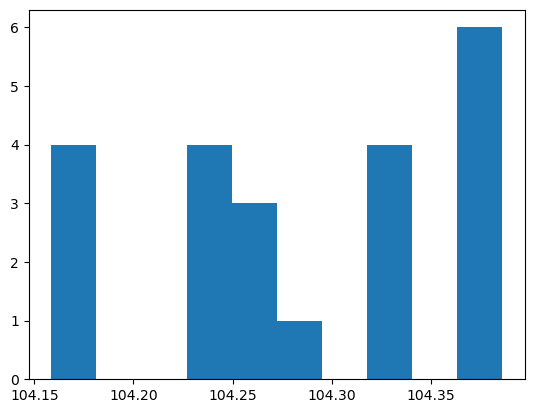

In [26]:
plt.hist(df2['Splitting'])

## Extracting metadata for these diads

In [27]:
meta_path=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\High_Density_Looping_Run\Metadata'
# Find files


# Put the common string you can in all your Ne lines here
ID_str='_'
file_ext_meta='txt' # Will only take files of this type 
exclude_str='Ne' # Will exclude files of this type, sometimes images have same name
prefix=None # Leave as none unless witec appended a number
Ne_files_meta=pf.get_files(path=mypath, file_ext=file_ext, exclude_str='Ne',
                            exclude_str_2='ne')

Ne_files_meta


exclude type
.png


['FI_1225down_1.txt',
 'FI_1225down_2.txt',
 'FI_1225up_1.txt',
 'FI_1225up_2.txt',
 'FI_1250down_1.txt',
 'FI_1250down_2.txt',
 'FI_1250up_1.txt',
 'FI_1250up_2.txt',
 'FI_1275down_1.txt',
 'FI_1275down_2.txt',
 'FI_1275up_1.txt',
 'FI_1275up_2.txt',
 'FI_1300down_1.txt',
 'FI_1300down_2.txt',
 'FI_1300up_1.txt',
 'FI_1300up_2.txt',
 'FI_1325down_1.txt',
 'FI_1325down_2.txt',
 'FI_1325up_1.txt',
 'FI_1325up_2.txt',
 'FI_1350up_1.txt',
 'FI_1350up_2.txt']

In [28]:
meta=pf.stitch_metadata_in_loop_witec(path=meta_path, Allfiles=Ne_files_meta, prefix=False, trupower=True)

working on fileFI_1225down_1.txt
working on fileFI_1225down_2.txt
working on fileFI_1225up_1.txt
working on fileFI_1225up_2.txt
working on fileFI_1250down_1.txt
working on fileFI_1250down_2.txt
working on fileFI_1250up_1.txt
working on fileFI_1250up_2.txt
working on fileFI_1275down_1.txt
working on fileFI_1275down_2.txt
working on fileFI_1275up_1.txt
working on fileFI_1275up_2.txt
working on fileFI_1300down_1.txt
working on fileFI_1300down_2.txt
working on fileFI_1300up_1.txt
working on fileFI_1300up_2.txt
working on fileFI_1325down_1.txt
working on fileFI_1325down_2.txt
working on fileFI_1325up_1.txt
working on fileFI_1325up_2.txt
working on fileFI_1350up_1.txt
working on fileFI_1350up_2.txt
Done


In [29]:
meta

,filename,date,power (mW),Int_time (s),accumulations,Mag (X),duration,24hr_time,sec since midnight,Spectral Center,index
16,FI_1325down_1.txt,"October 5, 2022\n",6.041,45.0,5.0,50.0,"['0h', '3m', '46s']",1:18:44 PM\n,47924.0,1324.987,16
12,FI_1300down_1.txt,"October 5, 2022\n",6.053,45.0,5.0,50.0,"['0h', '3m', '47s']",1:29:14 PM\n,48554.0,1299.957,12
8,FI_1275down_1.txt,"October 5, 2022\n",6.060,45.0,5.0,50.0,"['0h', '3m', '46s']",1:36:46 PM\n,49006.0,1274.962,8
4,FI_1250down_1.txt,"October 5, 2022\n",6.084,45.0,5.0,50.0,"['0h', '3m', '46s']",2:01:16 PM\n,50476.0,1250.004,4
0,FI_1225down_1.txt,"October 5, 2022\n",6.096,45.0,5.0,50.0,"['0h', '3m', '46s']",2:09:47 PM\n,50987.0,1224.986,0
2,FI_1225up_1.txt,"October 5, 2022\n",6.102,45.0,5.0,50.0,"['0h', '3m', '46s']",2:19:30 PM\n,51570.0,1224.986,2
6,FI_1250up_1.txt,"October 5, 2022\n",6.110,45.0,5.0,50.0,"['0h', '3m', '46s']",2:29:29 PM\n,52169.0,1250.004,6
10,FI_1275up_1.txt,"October 5, 2022\n",6.108,45.0,5.0,50.0,"['0h', '3m', '46s']",2:37:50 PM\n,52670.0,1274.962,10
14,FI_1300up_1.txt,"October 5, 2022\n",6.114,45.0,5.0,50.0,"['0h', '3m', '46s']",2:51:17 PM\n,53477.0,1299.957,14
18,FI_1325up_1.txt,"October 5, 2022\n",6.098,45.0,5.0,50.0,"['0h', '3m', '46s']",3:10:07 PM\n,54607.0,1324.987,18


## Stitching metadata and data together

In [30]:
meta['filename'][0]

'FI_1225down_1.txt'

In [31]:
df2['filename'][0]

'FI_1225down_1'

In [32]:
# remove these to get the pure file name you can compare 
file_m=pf.extracting_filenames_generic(names=meta['filename'],
    prefix=False, 
    suffix=False, 
   file_type='.txt')

file_m

array(['FI_1325down_1', 'FI_1300down_1', 'FI_1275down_1', 'FI_1250down_1',
       'FI_1225down_1', 'FI_1225up_1', 'FI_1250up_1', 'FI_1275up_1',
       'FI_1300up_1', 'FI_1325up_1', 'FI_1350up_1', 'FI_1325down_2',
       'FI_1300down_2', 'FI_1275down_2', 'FI_1250down_2', 'FI_1225down_2',
       'FI_1225up_2', 'FI_1250up_2', 'FI_1275up_2', 'FI_1300up_2',
       'FI_1325up_2', 'FI_1350up_2'], dtype=object)

In [33]:
# Remove these to get the pure file name
file_s=pf.extracting_filenames_generic(names=df2['filename'],
    prefix=False,
   file_type='.txt')
file_s

array(['FI_1225down_1', 'FI_1225down_2', 'FI_1225up_1', 'FI_1225up_2',
       'FI_1250down_1', 'FI_1250down_2', 'FI_1250up_1', 'FI_1250up_2',
       'FI_1275down_1', 'FI_1275down_2', 'FI_1275up_1', 'FI_1275up_2',
       'FI_1300down_1', 'FI_1300down_2', 'FI_1300up_1', 'FI_1300up_2',
       'FI_1325down_1', 'FI_1325down_2', 'FI_1325up_1', 'FI_1325up_2',
       'FI_1350up_1', 'FI_1350up_2'], dtype=object)

In [34]:
# Combining them together
meta['name_for_matching']=file_m
df2['name_for_matching']=file_s
df_combo=df2.merge(meta, on='name_for_matching')

(array([1., 7., 3., 5., 3., 0., 1., 1., 0., 1.]),
 array([1282.83422404, 1282.86569533, 1282.89716662, 1282.92863791,
        1282.96010919, 1282.99158048, 1283.02305177, 1283.05452306,
        1283.08599435, 1283.11746564, 1283.14893693]),
 <BarContainer object of 10 artists>)

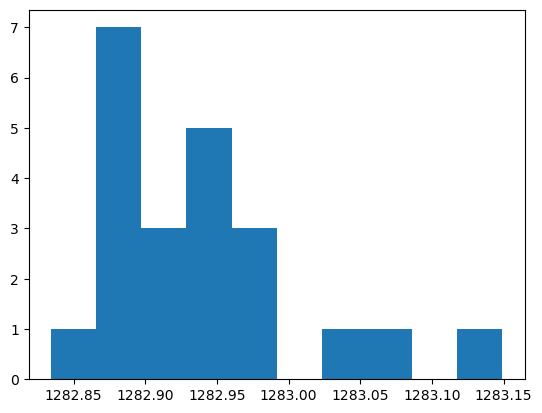

In [35]:
plt.hist(df_combo['Diad1_Cent'])

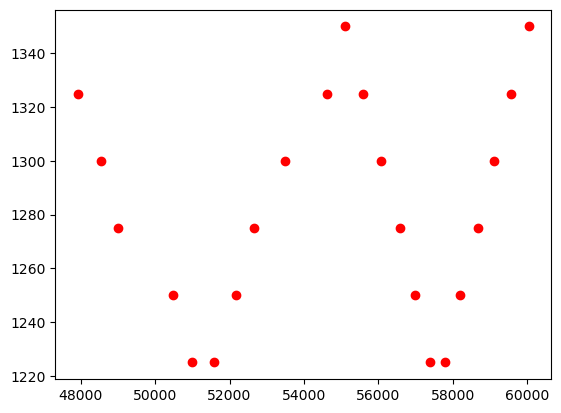

In [36]:
plt.plot( df_combo['sec since midnight'], df_combo['Spectral Center'], 'or')

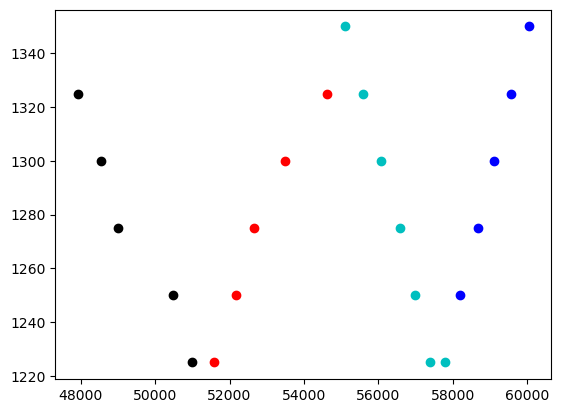

In [37]:
down1=df_combo['sec since midnight']<51500
up1=df_combo['sec since midnight'].between(51500, 55000)
down2=df_combo['sec since midnight'].between(55000, 57800)
up2=df_combo['sec since midnight']>57800
x='Spectral Center'
plt.plot(df_combo['sec since midnight'].loc[down1], df_combo[x].loc[down1],  'ok')
plt.plot(df_combo['sec since midnight'].loc[down2], df_combo[x].loc[down2],  'oc')

plt.plot(df_combo['sec since midnight'].loc[up1], df_combo[x].loc[up1],  'or')
plt.plot(df_combo['sec since midnight'].loc[up2], df_combo[x].loc[up2],  'ob')

plt.ticklabel_format(useOffset=False)


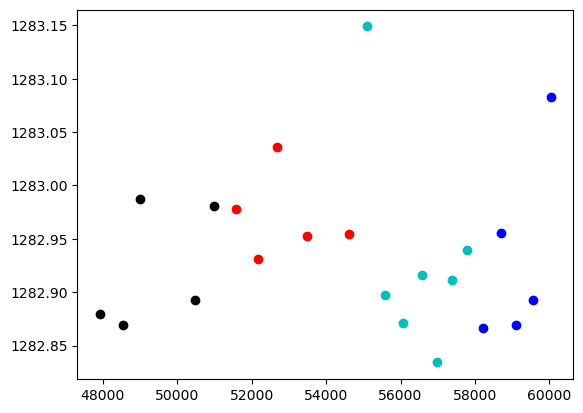

In [38]:

x='Diad1_Cent'
plt.plot(df_combo['sec since midnight'].loc[down1], df_combo[x].loc[down1],  'ok')
plt.plot(df_combo['sec since midnight'].loc[down2], df_combo[x].loc[down2],  'oc')

plt.plot(df_combo['sec since midnight'].loc[up1], df_combo[x].loc[up1],  'or')
plt.plot(df_combo['sec since midnight'].loc[up2], df_combo[x].loc[up2],  'ob')

plt.ticklabel_format(useOffset=False)


In [39]:
df_combo

,filename_x,Splitting,Diad1_Cent,Diad1_Area,Residual_Diad1,Diad2_Cent,Diad2_Area,Residual_Diad2,HB1_Cent,HB1_Area,...,date,power (mW),Int_time (s),accumulations,Mag (X),duration,24hr_time,sec since midnight,Spectral Center,index
0,FI_1225down_1,104.158549,1282.980437,3413.709013,2.779649,1387.138986,5630.577209,4.963728,1262.795356,296.721764,...,"October 5, 2022\n",6.096,45.0,5.0,50.0,"['0h', '3m', '46s']",2:09:47 PM\n,50987.0,1224.986,0
1,FI_1225down_2,104.179446,1282.911104,3136.844692,2.518666,1387.090550,5243.693234,5.874697,1262.794333,276.879333,...,"October 5, 2022\n",6.006,45.0,5.0,50.0,"['0h', '3m', '46s']",3:56:19 PM\n,57379.0,1224.986,1
2,FI_1225up_1,104.161812,1282.977521,3646.386988,2.843376,1387.139333,6064.443320,5.478375,1262.836438,315.334186,...,"October 5, 2022\n",6.102,45.0,5.0,50.0,"['0h', '3m', '46s']",2:19:30 PM\n,51570.0,1224.986,2
3,FI_1225up_2,104.163839,1282.939597,3319.517965,2.754589,1387.103436,5423.885247,6.706461,1262.757970,292.051883,...,"October 5, 2022\n",6.002,45.0,5.0,50.0,"['0h', '3m', '46s']",4:03:14 PM\n,57794.0,1224.986,3
4,FI_1250down_1,104.229822,1282.892538,3492.986258,2.863549,1387.122361,5802.619935,5.053949,1262.774854,313.228120,...,"October 5, 2022\n",6.084,45.0,5.0,50.0,"['0h', '3m', '46s']",2:01:16 PM\n,50476.0,1250.004,4
5,FI_1250down_2,104.233735,1282.834224,3379.463650,2.592445,1387.067959,5718.976609,4.940149,1262.700983,287.843686,...,"October 5, 2022\n",6.009,45.0,5.0,50.0,"['0h', '3m', '46s']",3:49:40 PM\n,56980.0,1250.004,5
6,FI_1250up_1,104.236390,1282.931396,3554.902547,2.861938,1387.167786,5968.315940,5.300965,1262.766374,299.243420,...,"October 5, 2022\n",6.110,45.0,5.0,50.0,"['0h', '3m', '46s']",2:29:29 PM\n,52169.0,1250.004,6
7,FI_1250up_2,104.229140,1282.866338,3293.289686,5.237542,1387.095478,5571.464604,4.999411,1301.062490,186.937619,...,"October 5, 2022\n",5.998,45.0,5.0,50.0,"['0h', '3m', '46s']",4:10:02 PM\n,58202.0,1250.004,7
8,FI_1275down_1,104.267204,1282.987640,3524.083499,2.807116,1387.254843,5843.291901,5.150330,1262.824939,305.075623,...,"October 5, 2022\n",6.060,45.0,5.0,50.0,"['0h', '3m', '46s']",1:36:46 PM\n,49006.0,1274.962,8
9,FI_1275down_2,104.275159,1282.915782,3470.846894,2.389738,1387.190941,5761.798416,4.778661,1262.759965,294.473498,...,"October 5, 2022\n",6.008,45.0,5.0,50.0,"['0h', '3m', '46s']",3:43:02 PM\n,56582.0,1274.962,9


In [40]:
a=pf.calculate_density_cornell(temp='SupCrit', Split=df_combo['Splitting'])

df_combo['density_cornell']=a['Preferred D']

In [53]:
Corr[0]

0.9989900869541514

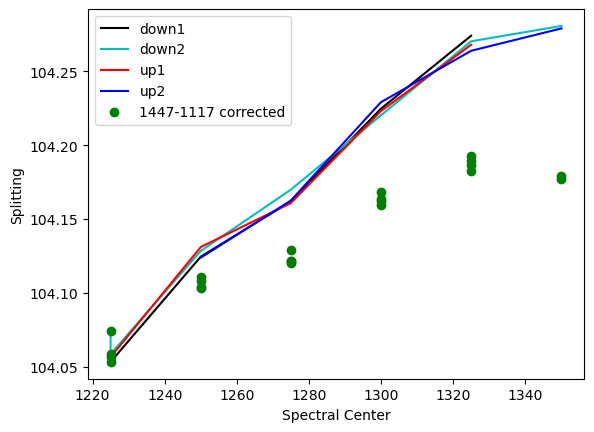

In [55]:

x='Spectral Center'
y= 'Splitting'#'density_cornell'

Corr=1.00852386-df_combo['Spectral Center']*7.78276082e-06
Corr_Split=df_combo['Splitting']*Corr



#Filt=(df_combo['Splitting'].between(104, 104.4))
plt.plot(df_combo[x].loc[down1&Filt], df_combo[y].loc[down1&Filt]*Corr[0],  '-k', label='down1')
plt.plot(df_combo[x].loc[down2&Filt], df_combo[y].loc[down2&Filt]*Corr[0],  '-c', ms=4, label='down2')

plt.plot(df_combo[x].loc[up1&Filt], df_combo[y].loc[up1&Filt]*Corr[0],  '-r', ms=3, label='up1')
plt.plot(df_combo[x].loc[up2&Filt], df_combo[y].loc[up2&Filt]*Corr[0],  '-b', ms=2, label='up2')

plt.ticklabel_format(useOffset=False)
plt.xlabel('Spectral Center')
plt.ylabel('Splitting')

#plt.ylim([104, 104.5])


plt.plot(df_combo[x], Corr_Split, 'og', label= '1447-1117 corrected')

plt.legend()

In [62]:
# Weird ones - FI_1225up_1, FI_1325down_2, FI_1325down_2
df_combo.loc[~(df_combo['Splitting'].between(104, 104.4))]

,filename_x,Splitting,Diad1_Cent,Diad1_Area,Residual_Diad1,Diad2_Cent,Diad2_Area,Residual_Diad2,HB1_Cent,HB1_Area,...,date,power (mW),Int_time (s),accumulations,Mag (X),duration,24hr_time,sec since midnight,Spectral Center,index
2,FI_1225up_1,103.292297,1282.977521,3646.386988,2.843376,1386.269818,5786.588788,44.908455,1262.836438,315.334186,...,"October 5, 2022\n",6.102,45.0,5.0,50.0,"['0h', '3m', '46s']",2:19:30 PM\n,51570.0,1224.986,2
17,FI_1325down_2,105.296446,1282.897224,3622.124906,2.762613,1388.193670,9714.401469,45.703093,1262.606749,343.407432,...,"October 5, 2022\n",6.020,45.0,5.0,50.0,"['0h', '3m', '46s']",3:26:27 PM\n,55587.0,1324.987,17
19,FI_1325up_2,105.301867,1282.892626,3289.841245,5.749055,1388.194493,7706.596287,40.458172,1269.366320,1.059025,...,"October 5, 2022\n",5.990,45.0,5.0,50.0,"['0h', '3m', '47s']",4:32:38 PM\n,59558.0,1324.987,19


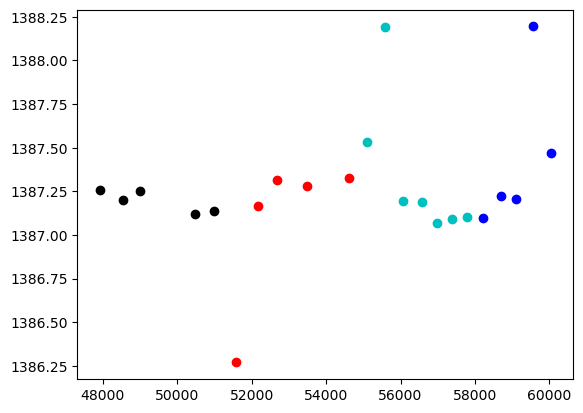

In [48]:

x='Diad2_Cent'
plt.plot(df_combo['sec since midnight'].loc[down1], df_combo[x].loc[down1],  'ok')
plt.plot(df_combo['sec since midnight'].loc[down2], df_combo[x].loc[down2],  'oc')

plt.plot(df_combo['sec since midnight'].loc[up1], df_combo[x].loc[up1],  'or')
plt.plot(df_combo['sec since midnight'].loc[up2], df_combo[x].loc[up2],  'ob')

plt.ticklabel_format(useOffset=False)


Text(0, 0.5, 'Diad 1 Peak')

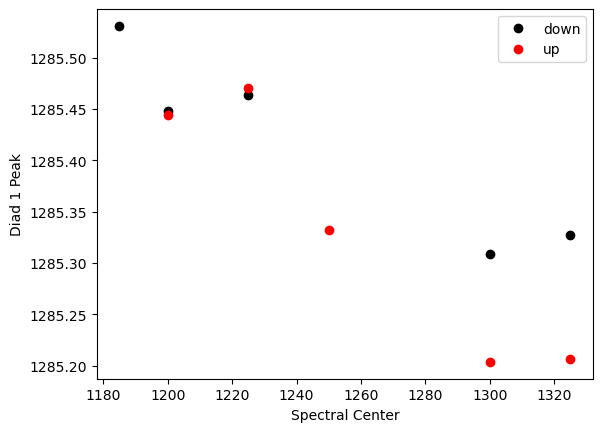

In [98]:
up=df_combo['sec since midnight']<55000
plt.plot(df_combo['Spectral Center'].loc[up], df_combo['Diad1_Cent'].loc[up],  'ok', label='down')
plt.plot(df_combo['Spectral Center'].loc[~up], df_combo['Diad1_Cent'].loc[~up],  'or', label='up')

plt.ticklabel_format(useOffset=False)
plt.legend()
plt.xlabel('Spectral Center')
plt.ylabel('Diad 1 Peak')


Text(0, 0.5, 'Diad 1 Peak')

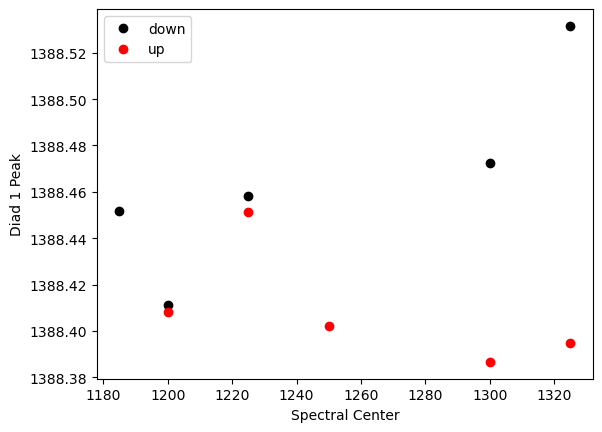

In [99]:
up=df_combo['sec since midnight']<55000
plt.plot(df_combo['Spectral Center'].loc[up], df_combo['Diad2_Cent'].loc[up],  'ok', label='down')
plt.plot(df_combo['Spectral Center'].loc[~up], df_combo['Diad2_Cent'].loc[~up],  'or', label='up')

plt.ticklabel_format(useOffset=False)
plt.legend()
plt.xlabel('Spectral Center')
plt.ylabel('Diad 1 Peak')


## Now load in the model for doing the Ne fitting

In [63]:
from pickle import load
import pickle

pickle_path='G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\High_Density_Looping_Run'
file_pkl=pickle_path + '/' + 'Ne_Line_Regression_ExampleVIBE.pck'
with open(file_pkl, 'rb') as file_handle:
    my_loaded_model = pickle.load(file_handle)

In [46]:
df_combo['Ne_Correction']=my_loaded_model(df_combo['sec since midnight'])
df_combo['Corrected_Splitting']=df_combo['Ne_Correction']*df_combo['Splitting']

In [47]:
df_combo['Ne_Correction']

0    0.999264
1    0.999287
2    0.999070
3    0.999143
4    0.998816
5    0.998427
6    0.998913
7    0.997538
8    0.998394
9    0.996908
Name: Ne_Correction, dtype: float64

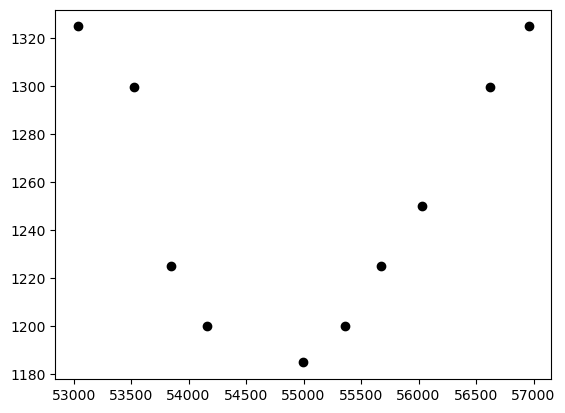

In [48]:

plt.plot(df_combo['sec since midnight'], df_combo['Spectral Center'], 'ok')

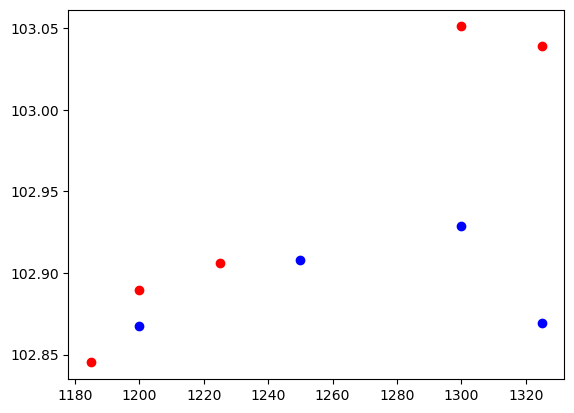

In [49]:

Filt=df_combo['Diad2_Area']<2000
plt.plot(df_combo['Spectral Center'].loc[Filt&up], df_combo['Corrected_Splitting'].loc[Filt&up],
           'or')
plt.plot(df_combo['Spectral Center'].loc[Filt&(~up)], df_combo['Corrected_Splitting'].loc[Filt&(~up)],
           'ob')

Text(0, 0.5, 'Splitting')

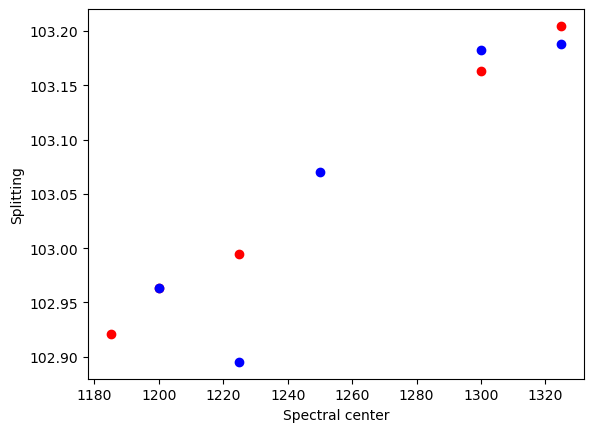

In [50]:
plt.plot(df_combo['Spectral Center'].loc[up], df_combo['Splitting'].loc[up],
           'or')
plt.plot(df_combo['Spectral Center'].loc[~up], df_combo['Splitting'].loc[~up],
           'ob')
plt.xlabel('Spectral center')
plt.ylabel('Splitting')


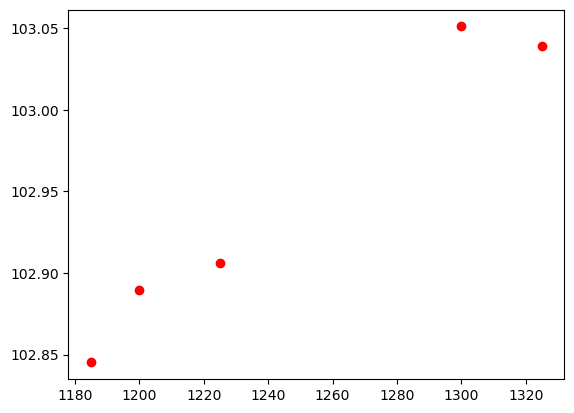

In [40]:
plt.plot(df_combo['Spectral Center'].loc[Filt&up], df_combo['Corrected_Splitting'].loc[Filt&up],
           'or')

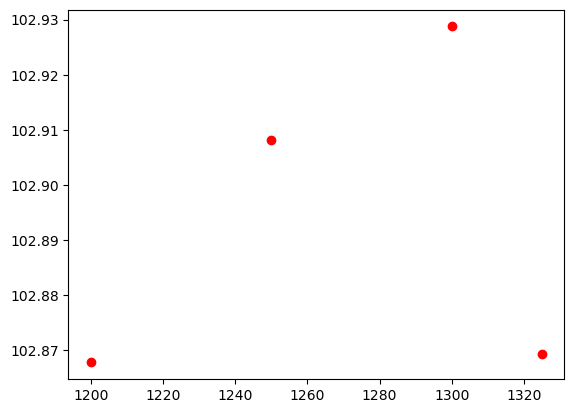

In [41]:
plt.plot(df_combo['Spectral Center'].loc[Filt&(~up)], df_combo['Corrected_Splitting'].loc[Filt&(~up)],
           'or')

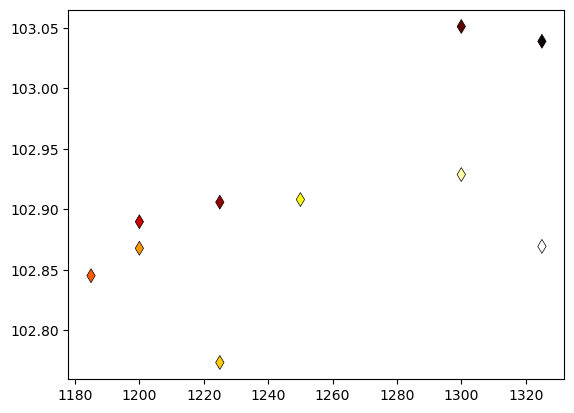

In [40]:
plt.scatter(df_combo['Spectral Center'], df_combo['Corrected_Splitting'],
            marker='d', s=50, edgecolors='k', linewidths=0.5,
             cmap='hot',
            c=df_combo['sec since midnight'])

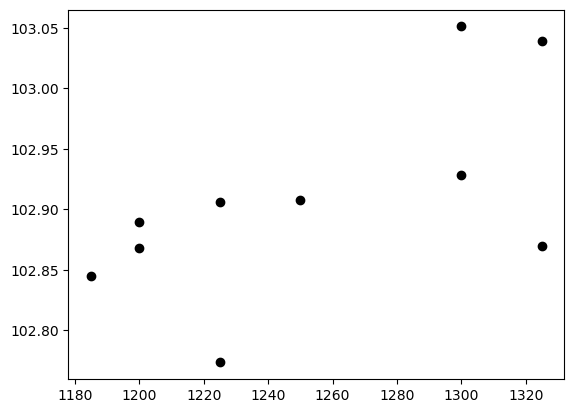

In [41]:
plt.plot(df_combo['Spectral Center'], df_combo['Corrected_Splitting'], 'ok')